<h1 style="font-size:30px;">Object Tracking</h1> 

Object tracking is an important and practical topic that has a very long history and has been applied to numerous fields. At a high level, tracking refers to estimating the state of an object (e.g., position and velocity) based on sensor measurements, and predicting its future location. For example, tracking the location of an aircraft based on radar measurements is a typical application of tracking. In the context of computer vision, tracking typically refers to processing video frames and predicting the location of an object (or multiple objects), in future video frames. 

In computer vision, this is accomplished using a motion model and an appearance model. The motion model will estimate the position and velocity of an object and use that information to predict the location of an object in future video frames and the appearance model encodes what the object looks like and then search the region around the predicted location from the motion model to then fine-tune the location of the object. So the motion model is an approximation to where the object might be located in a future video frame and the appearance model is used to fine-tune that estimate.


OpenCV contains an API Tracker Class that includes several different tracker models which are all based on different algorithms. Depending on the application one model might be better suited than another. In this notebook, we will take a look as to how each of these models performs on a sample video of a race car.

## <font style="color:rgb(50,120,229)">Tracking Models Available in the  OpenCV Tracker Class</font>

1. BOOSTING
2. CSRT
3. KCF 
4. MEDIANFLOW
5. MIL
6. MOSSE
7. TLD

# 1. Overview

## Import libraries

In [1]:
import cv2
import os
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip

# 2. Perform Tracking

## 2.1 Define Functions

In [2]:
def drawBannerText(frame, text, banner_height_percent=0.08, font_scale=0.8, text_color=(0,255,0), font_thickness=2):
    banner_height = int(banner_height_percent * frame.shape[0])
    cv2.rectangle(frame, (0,0), (frame.shape[1], banner_height), (0,0,0), thickness=-1)
    
    left_offset = 20
    location = (left_offset, int(15 + (banner_height_percent * frame.shape[0])/2))
    cv2.putText(frame, text, location, cv2.FONT_HERSHEY_SIMPLEX, font_scale, text_color, font_thickness, cv2.LINE_AA)


In [3]:
def drawRectangle(frame, bbox, color=(255,0,0)):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, color, 2, 1)
    

In [4]:
def displayRectangle(frame, bbox, color=(255,0,0)):
    plt.figure(figsize=(20,10))
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox, color)
    frameCopy = cv2.cvtColor(frameCopy, cv2.COLOR_RGB2BGR)
    plt.imshow(frameCopy)
    plt.axis('off')

In [5]:
def drawText(frame, text, location=(20,20), font_scale=1, color=(50,170,50), font_thickness=2):
    cv2.putText(frame, text, location, cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, 
                font_thickness, cv2.LINE_AA)

## 2.2 Create Tracker Instance

In [6]:
tracker_types = ['BOOSTING', 'CSRT', 'KCF', 'MEDIANFLOW', 'MIL', 'MOSSE', 'TLD']

# Change index to change the tracker type
tracker_type = tracker_types[0]

if tracker_type == 'BOOSTING':
    tracker = cv2.legacy.TrackerBoosting_create()
elif tracker_type == 'CSRT':
    tracker = cv2.legacy.TrackerCSRT_create()
elif tracker_type == 'KCF':
    tracker = cv2.legacy.TrackerKCF_create()
elif tracker_type == 'MEDIANFLOW':
    tracker = cv2.legacy.TrackerMedianFlow_create()
elif tracker_type == 'MIL':
    tracker = cv2.legacy.TrackerMIL_create()
elif tracker_type == 'MOSSE':
    tracker = cv2.legacy.TrackerMOSSE_create()
elif tracker_type == 'TLD':
    tracker = cv2.legacy.TrackerTLD_create()

## 2.3 Video Capture and Video Writer Objects

In [7]:
# Define input video
input_video = 'input.mp4'
# Video capture object
video_cap = cv2.VideoCapture(input_video)

# Confirm video can be opened
if video_cap.isOpened():
    width = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(video_cap.get(cv2.CAP_PROP_FPS))
else:
    print('Could not open video')
    sys.exist()
    
# Slow down video for demonstration purposes
fps_write =20

# Set up video writer object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')

# Create video writer object
video_output_file_name = 'output_' + tracker_type + '.mp4'
video_out = cv2.VideoWriter(video_output_file_name, fourcc, fps_write, (width, height))


## 2.4 Define initial bounding box

The initial location of the object will be identified manually in this case. Normally this would be accomplished with an object detection model to identify the object(s) to be tracked. This process is normally referred to as object acquisition or object detection.

(444, 401, 56, 86)


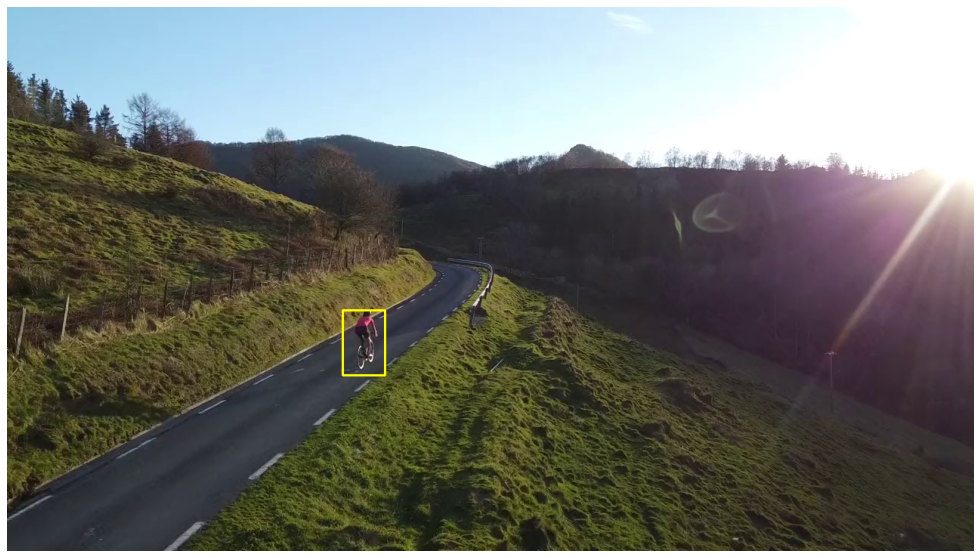

In [8]:
# Define bounding box
bbox = None
ok, frame = video_cap.read()

# Display the initial frame and alow the user to  
# manually select the bounding box with the mouse.
# When done, hit the space bar or Enter key to complete the operation.
if bbox == None:
    bbox = cv2.selectROI(frame, False)
    print(bbox)
    
frame_copy = frame.copy()
displayRectangle(frame_copy, bbox, color=(0,255,255))

## 2.5 Tracker API

In [9]:
# Initialize the tracker with the first frame and a bounding box 
tracker.init(frame, bbox)

True

In [10]:
# Process video frames and tracker object
while video_cap.isOpened():
    ok, frame = video_cap.read()
    if not ok:
        break
        
    # Start timer
    timer = cv2.getTickCount()
    
    # Update tracker
    ok, bbox = tracker.update(frame)
    
    # Calculate fps
    fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)
    
    # Draw bounding box
    if ok:
        drawRectangle(frame, bbox, color=(0,255,255))
    else:
        drawText(frame, 'Tracking Failed!', location=(80,140), color=(0,0,255))
        
    # Display info
    drawBannerText(frame, tracker_type + ' TRACKER' + '- FPS : ' + str(int(fps)))
    
    # Write frame to video
    video_out.write(frame)

video_cap.release()
video_out.release()

In [11]:
clip = VideoFileClip(video_output_file_name)
clip = clip.resize(height=600)
clip.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
